# MOLECULE GENERATOR

In [ ]:
from mlchem.chem.manipulation import (create_molecule,
                                      MolGenerator,
                                      MolCleaner,
                                      PatternRecognition,
                                      smarts_from_string)
from mlchem.chem.visualise.drawing import MolDrawer
import pandas as pd
import numpy as np

## Create a set of alcohols

In [ ]:
generator = MolGenerator()
generator.generate_smiles(template_string='[#6][OX2H]',
                          n_molecules=300,
                          n_fragments=10,
                          n_substitutions=10,
                          attempt_limit=10000,
                          include_extremities=True)

# Quick kekulisation and neutralisation.
# More in the Molecule Cleaning example notebook

cleaner = MolCleaner(generator.smiles_generated)
cleaner.initialise_smiles()
cleaner.neutralise_smiles()
generator.smiles_generated = cleaner.smiles

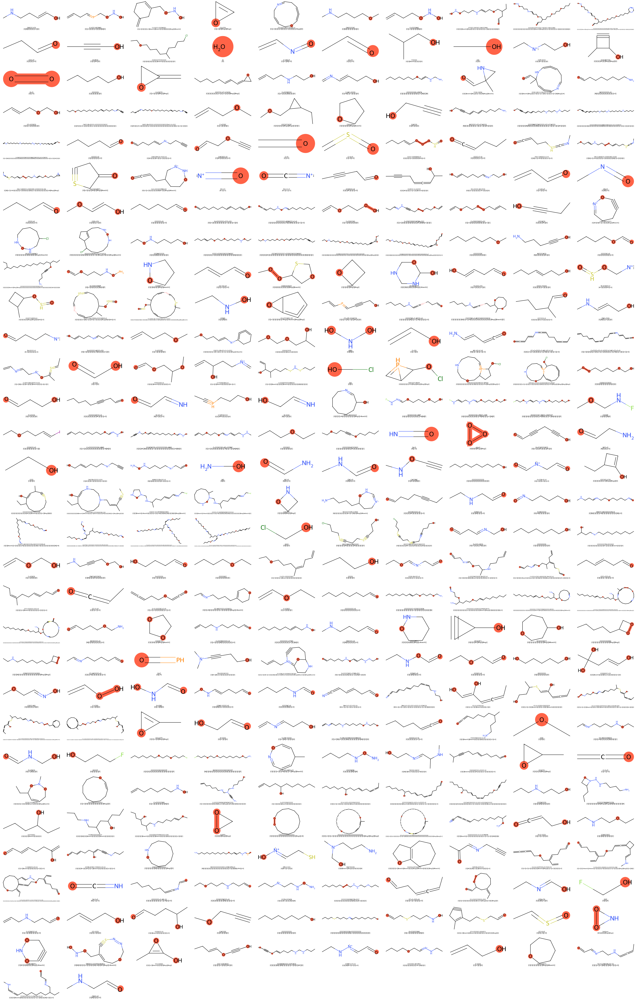

In [3]:
drawer = MolDrawer(size=(400,200))
drawer.update_drawing_options(legendFontSize=25)
pattern_atoms = [PatternRecognition.Base.check_smarts_pattern(target,generator.template_smarts)[1] for target in generator.smiles_generated]
images = [drawer.draw_mol(create_molecule(m),legend=l,highlightAtoms=a) for m,l,a in zip(generator.smiles_generated,generator.double_legend,pattern_atoms)]
drawer.legend_list = generator.double_legend
drawer.show_images_grid(images,10)

In [52]:
data_1 = pd.DataFrame()
data_1['SMILES'] = generator.smiles_generated
data_1['CLASS'] = list(np.int32(np.zeros(len(generator.smiles_generated))))
data_1

,SMILES,CLASS
0,CCCC=C=NCCCCO,0
1,CCCCCOCCCC=C=NCCCCO,0
2,CCCOCC(C)O,0
3,CC(CS#CCO)OCCCC=CN,0
4,CS#CCCNCCO,0
...,...,...
295,CC=NNCO,0
296,OCCCCCC[N+]=CC=NNCO,0
297,O=CCCCCC=NCCCCCCCO,0
298,OCCOSCF,0


## Create a set of random chemicals

In [59]:
generator = MolGenerator()
generator.generate_smiles(template_smiles='C',
                          n_molecules=300,
                          n_fragments=20,
                          n_substitutions=3,
                          attempt_limit=10000,
                          include_extremities=True)

# Quick kekulisation and neutralisation.
# More in the Molecule Cleaning example notebook

cleaner = MolCleaner(generator.smiles_generated)
cleaner.initialise_smiles()
cleaner.neutralise_smiles()
generator.smiles_generated = cleaner.smiles

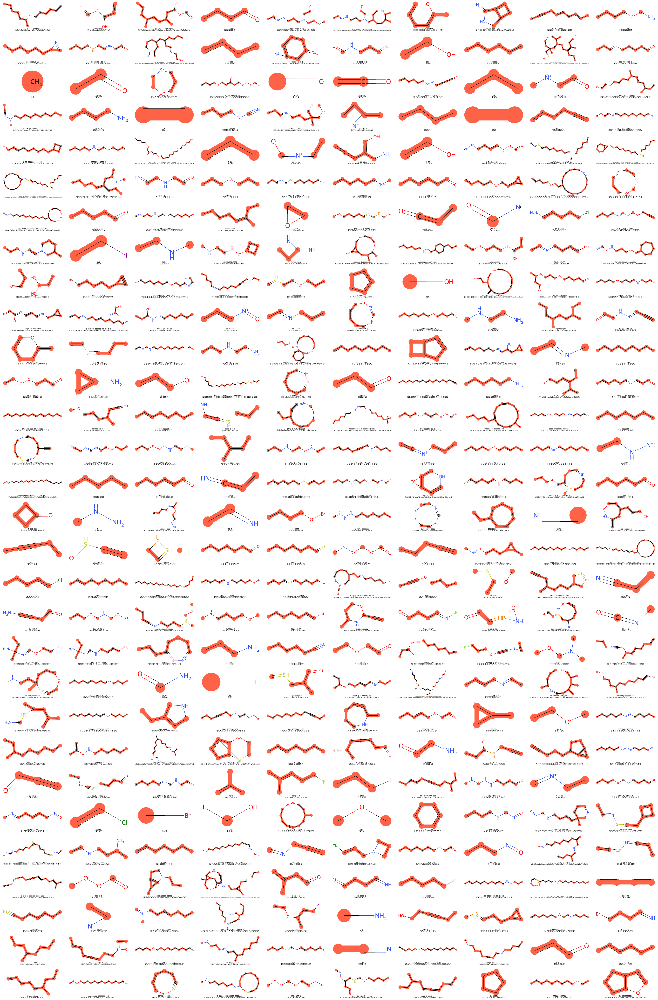

In [60]:
drawer = MolDrawer(size=(400,200))
drawer.update_drawing_options(legendFontSize=25)
pattern_atoms = [PatternRecognition.Base.check_smarts_pattern(target,generator.template_smarts)[1] for target in generator.smiles_generated]
images = [drawer.draw_mol(create_molecule(m),legend=l,highlightAtoms=a) for m,l,a in zip(generator.smiles_generated,generator.double_legend,pattern_atoms)]
drawer.legend_list = generator.double_legend
drawer.show_images_grid(images,10)

In [61]:
data_2 = pd.DataFrame()
data_2['SMILES'] = generator.smiles_generated
data_2['CLASS'] = list(np.int32(np.ones(len(generator.smiles_generated))))
data_2

,SMILES,CLASS
0,CC=CCCC(C)OCCCCCC,1
1,C=CC(O)OC=O,1
2,CCCC(C)CCC(C)CC(O)OC=O,1
3,CCCC=O,1
4,CC=NNCCCN(CC=O)CCOC,1
...,...,...
295,C=NOC(CC=O)C[SH]=COCCCCC,1
296,CCCC=C=CCC(C)CC,1
297,C1=CCCC1,1
298,CCCCCCCCCOCC,1


# Save data

In [62]:
data = pd.concat([data_1,data_2],axis=0)
data

,SMILES,CLASS
0,CCCC=C=NCCCCO,0
1,CCCCCOCCCC=C=NCCCCO,0
2,CCCOCC(C)O,0
3,CC(CS#CCO)OCCCC=CN,0
4,CS#CCCNCCO,0
...,...,...
295,C=NOC(CC=O)C[SH]=COCCCCC,1
296,CCCC=C=CCC(C)CC,1
297,C1=CCCC1,1
298,CCCCCCCCCOCC,1


In [67]:
data.drop_duplicates('SMILES',inplace=True)
data.to_csv('../data/data.csv',index=None)